In [3]:
!pwd

/Users/somang/Desktop/mymac/빅데이터/청주원도심


In [4]:
!ls

R_0912_충청남도 중소도시 쇠퇴특성 분석방법 적용에 관한 연구(윤정미).pdf
SBJ_2309_001.zip
Untitled.ipynb
data
청주시 자전거도로 현황_20191010..xlsx
충청북도 청주시_아파트 분양 현황_20221026.csv
충청북도 청주시_음식점 현황_20230731.csv
충청북도 청주시_공원현황_20220127.csv
충청북도 청주시_산업단지별 입주기업 목록_20220831.csv
충청북도 청주시_지방소득세 징수현황_20201231.csv
충청북도 청주시_청주시내버스 주요승강장 이용인원_20201224.csv
충청북도 청주시_기초생활보장수급자 현황_20201231.csv
충청북도 청주시_국민기초생활보장수급자수_20221231.csv


In [168]:
import pandas as pd
# row 생략 없이 출력
pd.set_option('display.max_rows', None)
# col 생략 없이 출력
pd.set_option('display.max_columns', None)

### 인구성장율

In [291]:
filename = "data/22.청주시_주민등록인구현황.csv"
file = pd.read_csv(filename)
df = pd.DataFrame(file)
df.head(5)

,adm_cd,adm_nm,year,m_pop,fm_pop
0,4311131000,충청북도 청주시 상당구 낭성면,201701,1232,1140
1,4311132000,충청북도 청주시 상당구 미원면,201701,2757,2636
2,4311133000,충청북도 청주시 상당구 가덕면,201701,2259,2066
3,4311134000,충청북도 청주시 상당구 남일면,201701,3901,3746
4,4311135000,충청북도 청주시 상당구 문의면,201701,2383,2165


In [292]:
loc_list = ["충청북도 청주시 상당구 중앙동",
           "충청북도 청주시 상당구 성안동",
           "충청북도 청주시 흥덕구 복대1동",
           "충청북도 청주시 흥덕구 복대2동",
           "충청북도 청주시 서원구 사창동",
           "충청북도 청주시 상당구 용암동"]


In [296]:
pop_list_2017 = []
pop_list_2022 = []
for i in range(len(loc_list)):
    cur = df.loc[df.adm_nm == loc_list[i]]
    cur.index= range(0,len(cur))
    cur['year'] = cur['year'].apply(lambda _: str(_))

    test_df = cur[cur['year'].str.contains('2017')]
    all_pop_2017 = sum(test_df.m_pop) + sum(test_df.fm_pop)
    print(loc_list[i])
    print("2017 : ", all_pop_2017)
    pop_list_2017.append(all_pop_2017)
    
    test_df = cur[cur['year'].str.contains('2022')]
    all_pop_2022 = sum(test_df.m_pop) + sum(test_df.fm_pop)
    print(loc_list[i])
    print("2022 : ",all_pop_2022)
    pop_list_2022.append(all_pop_2022)


충청북도 청주시 상당구 중앙동
2017 :  77649
충청북도 청주시 상당구 중앙동
2022 :  82080
충청북도 청주시 상당구 성안동
2017 :  75388
충청북도 청주시 상당구 성안동
2022 :  80813
충청북도 청주시 흥덕구 복대1동
2017 :  641022
충청북도 청주시 흥덕구 복대1동
2022 :  601726
충청북도 청주시 흥덕구 복대2동
2017 :  216476
충청북도 청주시 흥덕구 복대2동
2022 :  191779
충청북도 청주시 서원구 사창동
2017 :  194933
충청북도 청주시 서원구 사창동
2022 :  176090


<ipython-input-296-3ce57fe3cdaf>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cur['year'] = cur['year'].apply(lambda _: str(_))


AttributeError: Can only use .str accessor with string values!

### 상권정보

In [306]:
filename = "data/18.청주시_상권정보.csv"
file = pd.read_csv(filename)
df = pd.DataFrame(file)
df.head(100)

,com_lc_cd,com_lc_nm,com_mc_cd,com_mc_nm,com_sc_cd,com_sc_nm,ksic_cd,ksic_nm,adb_emd_cd,adb_emd_nm,road_address,lon,lat
0,R,학문/교육,R04,학원-어학,R04A01,학원-외국어/어학,P85502,외국어학원,4311259000,성화.개신.죽림동,"충청북도 청주시 서원구 복대로 7, (개신동)",127.446061,36.617928
1,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,I56220,비알콜 음료점업,4311154500,성안동,"충청북도 청주시 상당구 대성로 38, (서운동)",127.493371,36.628602
2,D,소매,D07,가정/주방/인테리어,D07A15,유리/페인트/철물건축자재,G47519,"페인트, 유리 및 기타 건설자재 소매업",4311257000,수곡1동,"충청북도 청주시 서원구 매봉로 64, (수곡동, 산남주공3차)",127.478662,36.616083
3,D,소매,D15,가구소매,D15A01,일반가구소매,G47520,가구 소매업,4311231000,남이면,"충청북도 청주시 서원구 남이면 청남로 1272, (척산리)",127.440092,36.562169
4,R,학문/교육,R04,학원-어학,R04A01,학원-외국어/어학,P85502,외국어학원,4311454000,율량.사천동,"충청북도 청주시 청원구 공항로 118, (율량동)",127.485764,36.667772
5,F,생활서비스,F01,이/미용/건강,F01A01,여성미용실,S96112,두발미용업,4311257000,수곡1동,"충청북도 청주시 서원구 수영로23번길 21, (수곡동)",127.488365,36.616270
6,F,생활서비스,F15,주택수리,F15A01,주택수리종합,S95399,그외 기타 개인 및 가정용품 수리업,4311252000,사직2동,"충청북도 청주시 서원구 호국로 32-1, (사직동)",127.474882,36.631108
7,F,생활서비스,F01,이/미용/건강,F01A01,여성미용실,S96112,두발미용업,4311374100,복대1동,"충청북도 청주시 흥덕구 월명로 21, (복대동)",127.453185,36.636616
8,Q,음식,Q01,한식,Q01A02,갈비/삼겹살,I56111,한식 음식점업,4311455000,오근장동,"충청북도 청주시 청원구 공항로 238, (주중동)",127.484006,36.678164
9,Q,음식,Q01,한식,Q01A01,한식/백반/한정식,I56111,한식 음식점업,4311167000,영운동,"충청북도 청주시 상당구 영운로37번길 9, (영운동)",127.495883,36.618798


In [199]:
df.com_lc_nm.drop_duplicates()

0         학문/교육
1            음식
2            소매
5         생활서비스
17     관광/여가/오락
40          부동산
54          스포츠
103          숙박
Name: com_lc_nm, dtype: object

In [320]:
# join함수를 이용하여 이어주고 contains 함수에 넣기
com_loc_list = ["중앙동","성안동","복대1동","복대2동"]
test = '|'.join(com_loc_list)
result = df[df['adb_emd_nm'].str.contains(test)]
result

,com_lc_cd,com_lc_nm,com_mc_cd,com_mc_nm,com_sc_cd,com_sc_nm,ksic_cd,ksic_nm,adb_emd_cd,adb_emd_nm,road_address,lon,lat
1,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,I56220,비알콜 음료점업,4311154500,성안동,"충청북도 청주시 상당구 대성로 38, (서운동)",127.493371,36.628602
7,F,생활서비스,F01,이/미용/건강,F01A01,여성미용실,S96112,두발미용업,4311374100,복대1동,"충청북도 청주시 흥덕구 월명로 21, (복대동)",127.453185,36.636616
12,D,소매,D05,의복의류,D05A05,아동복판매,G47416,셔츠 및 기타 의복 소매업,4311374100,복대1동,"충청북도 청주시 흥덕구 사직대로11번길 9, (복대동)",127.448401,36.634773
21,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,I56219,기타 주점업,4311154500,성안동,"충청북도 청주시 상당구 남사로140번길 6, (남문로2가)",127.490409,36.631851
35,D,소매,D10,건강/미용식품,D10A07,건강원,G47216,건강보조식품 소매업,4311154500,성안동,"충청북도 청주시 상당구 상당로3번길 18-1, (석교동)",127.490050,36.628551
36,D,소매,D05,의복의류,D05A10,한복/갈옷/민속옷,G47412,한복 소매업,4311154500,성안동,"충청북도 청주시 상당구 무심동로336번길 100-2, (남문로1가)",127.488456,36.631302
50,D,소매,D05,의복의류,D05A02,캐쥬얼/스포츠의류,G47416,셔츠 및 기타 의복 소매업,4311154500,성안동,"충청북도 청주시 상당구 상당로 55, (남문로2가)",127.490343,36.633284
56,F,생활서비스,F02,세탁/가사서비스,F02A01,세탁소/빨래방,S96912,가정용 세탁업,4311374100,복대1동,"충청북도 청주시 흥덕구 증안로 100, (복대동, 영조아름다운나날2차)",127.433369,36.635244
59,D,소매,D07,가정/주방/인테리어,D07A02,주방용품,G47592,식탁 및 주방용품 소매업,4311154500,성안동,"충청북도 청주시 상당구 상당로1번길 22, (석교동)",127.489694,36.628361
64,N,관광/여가/오락,N02,무도/유흥/가무,N02A01,노래방,R91223,노래연습장 운영업,4311374100,복대1동,"충청북도 청주시 흥덕구 진재로15번길 15, (복대동)",127.428974,36.632204


In [313]:
!pip install folium

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.3/102.3 KB 1.1 MB/s eta 0:00:00a 0:00:01
You should consider upgrading via the '/Users/somang/opt/anaconda3/bin/python -m pip install --upgrade pip' command.


In [323]:
import folium

from folium.plugins import MarkerCluster


m = folium.Map(
    location=[36.681404, 127.493130],
    zoom_start=15
)

coords = result[['lat', 'lon']]


marker_cluster = MarkerCluster().add_to(m)

for lat, long in zip(coords['lat'], coords['lon']):
    folium.Marker([lat, long], icon = folium.Icon(color="green")).add_to(marker_cluster)
m

### 기초생활수급자수

In [238]:
filename = "충청북도 청주시_국민기초생활보장수급자수_20221231.csv"
file = pd.read_csv(filename,encoding='cp949')
df = pd.DataFrame(file)
df

,읍면동명,수급자수
0,충청북도 청주시 상당구 낭성면,103
1,충청북도 청주시 상당구 미원면,325
2,충청북도 청주시 상당구 가덕면,192
3,충청북도 청주시 상당구 남일면,216
4,충청북도 청주시 상당구 문의면,249
5,충청북도 청주시 상당구 중앙동,274
6,충청북도 청주시 상당구 성안동,469
7,충청북도 청주시 상당구 탑대성동,476
8,충청북도 청주시 상당구 영운동,802
9,충청북도 청주시 상당구 금천동,1278


In [245]:
loc_list = ["충청북도 청주시 상당구 중앙동",
           "충청북도 청주시 상당구 성안동",
           "충청북도 청주시 흥덕구 복대1동",
           "충청북도 청주시 흥덕구 복대2동",
           "충청북도 청주시 서원구 사창동",
           "충청북도 청주시 상당구 용암동"]

In [246]:
df.loc[df['읍면동명'] == loc_list[0]]

,읍면동명,수급자수
5,충청북도 청주시 상당구 중앙동,274


In [287]:
# join함수를 이용하여 이어주고 contains 함수에 넣기
test = '|'.join(loc_list)
result = df[df['읍면동명'].str.contains(test)]
result['읍면동명'] = result['읍면동명'].str.replace('충청북도 청주시 상당구 ','')
result['읍면동명'] = result['읍면동명'].str.replace('충청북도 청주시 흥덕구 ',' ')
result['읍면동명'] = result['읍면동명'].str.replace('충청북도 청주시 서원구 ',' ')
result

<ipython-input-287-43592533c929>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result['읍면동명'] = result['읍면동명'].str.replace('충청북도 청주시 상당구 ','')
<ipython-input-287-43592533c929>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result['읍면동명'] = result['읍면동명'].str.replace('충청북도 청주시 흥덕구 ',' ')
<ipython-input-287-43592533c929>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

,읍면동명,수급자수
5,중앙동,274
6,성안동,469
17,사창동,774
28,복대1동,942
29,복대2동,1035


In [288]:
import matplotlib
import platform

print(platform.system()) # 플랫폼 확인

# Window
if platform.system() == 'Windows':
    matplotlib.rc('font', family='Malgun Gothic')
elif platform.system() == 'Darwin': # Mac
    matplotlib.rc('font', family='AppleGothic')
else: #linux
    matplotlib.rc('font', family='NanumGothic')

# 그래프에 마이너스 표시가 되도록 변경
matplotlib.rcParams['axes.unicode_minus'] = False

Darwin


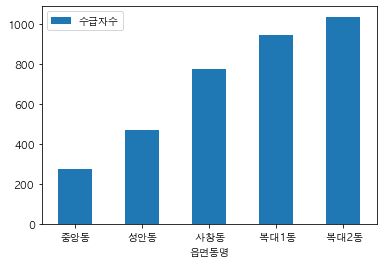

In [289]:
result.plot.bar(x='읍면동명', y='수급자수', rot=0)


In [297]:
pop_list_2017

[77649, 75388, 641022, 216476, 194933]

In [ ]:
result.insert(2,'2017 인구',pop_list_2017)

In [301]:
result.insert(2,'2022 인구',pop_list_2022)

In [302]:
result

,읍면동명,수급자수,2022 인구,2017 인구
5,중앙동,274,82080,77649
6,성안동,469,80813,75388
17,사창동,774,601726,641022
28,복대1동,942,191779,216476
29,복대2동,1035,176090,194933


In [305]:
result['수급자수']/result['2022 인구']*10000

5     33.382066
6     58.035217
17    12.862997
28    49.119038
29    58.776762
dtype: float64

### 자전거도로

In [326]:
filename = "청주시 자전거도로 현황_20191010.xlsx"
file = pd.read_excel(filename)
df = pd.DataFrame(file)
df.head(5)

,일련\n번호,1. 기본사항,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,2. 자전거도로 현황,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29
0,NaN,노선명,기점,NaN,종점,NaN,주요경유지,노선연장\n(km),총연장(m)\n(a+c+d+e),전용도로(a),NaN,자전거우선도로(c),NaN,분리형 겸용도로(d),NaN,NaN,NaN,NaN,비분리형 겸용도로(e),NaN,NaN,NaN,NaN,이용목적,보도(비분리형),NaN,자전거도로,NaN,NaN,NaN
1,NaN,NaN,"시설물,\n교차로명",지번,"시설물,\n교차로명",지번,NaN,NaN,NaN,연장\n(m),폭원\n(m),연장\n(m),도로\n폭원\n(m),연장\n(m),최소자전거\n도로폭원\n(m),최대자전거\n도로폭원\n(m),최소보도\n폭원\n(m),최대보도\n폭원\n(m),연장\n(m),최소도로\n폭원\n(m),최대도로\n폭원\n(m),최소유효\n폭원\n(m),최대유효\n폭원\n(m),NaN,색상,재질,색상,재질,NaN,NaN
2,NaN,총계,NaN,NaN,NaN,NaN,NaN,582.05,530901,76455,NaN,20082,NaN,284705,NaN,NaN,NaN,NaN,149659,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.0,무심천자전거길,NaN,정상동 368-24,고은사거리,고은리 461-2,청주시아동복지관,15.41,15406,15406,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,관광레저,암적/검정,아스콘,NaN,NaN,NaN,NaN
4,2.0,오천자전거길,NaN,오송읍 서평리 693-20,NaN,정상동 368-24,청주시하수처리장,44.56,26955,26955,3.0~4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,관광레저,암적,아스콘,NaN,NaN,NaN,NaN
